# <center> Поиск аномалий в данных </center>

![](https://i.pinimg.com/originals/e5/c4/0d/e5c40dd06a9cdda2ac88101897606543.gif)

## <center> Как 3 сигмы, только лучше </center>



# Зачем вообще искать аномалии?


- Предобработка данных: убираем выбросы, чтобы не переобучиться
- Анализ выбросов: хотим найти, понять и обезвредить
- Поиск аномалий как самоцель

**Поиск аномалий** может быть как конечной целью анализа и построения моделей, так и промежуточным этапом подготовки и очистки данных. В первом сценарии мы хотим научиться для каждого объекта выборки выносить вердикт, является ли он аномальным/нестандартным, а во-втором мы находим и убираем выбросы в данных, чтобы в дальнейшем получить более устойчивые модели.

В [определении](https://scikit-learn.org/stable/modules/outlier_detection.html) из документации scikit-learn, здача поиска аномалий разделяется на два возможных типа:

- **Outlier detection** (поиск выбросов): в тренировочной выборке содержатся выбросы, которые определяются как наблюдения, лежащие далеко от остальных. Таким образом, алгоритмы для детектирования выбросов пытаются найти регионы, где сосредоточена основная масса тренировочных данных, игрорируя аномальные наблюдения.
- **Novelty detection** (поиск "новизны"): тренировочная выборка не загрязнена выбросами, и мы хотим научиться отвечать на вопрос "является ли новое наблюдение выбросом".



## Сложности при поиске аномалий

На практике задача поиска аномалий зачастую не сводится к построению бинарного классификатора "выброс/не выброс". Реальные данные редко бывают размечены и мы вынуждены использовать методы обучения без учителя.

Одновременно с этим возникает вопрос о построении надежной схемы валидации, ведь если "правильных ответов" у нас нет, то и понять, насколько алгоритм справляется со своей задачей, уже сложнее. Здесь очень помогут экспертные оценки о проценте аномальных объектов, которые ожидаются в выборке, так как с ними можно будет сравнивать прогнозные значения и варьировать тем самым чувствительность алгоритмов.

Если же поиск и очистка от аномалий - это шаг в подготовке данных для последующего моделирования, то можно использовать стандартные подходы: разбиение на train/test, кросс-валидацию и т.д. Конечно, чтобы избежать переобучения, очистка в этом случае должна проводиться только на тренировочной части датасета.

# Методы

## Supervised?

## Unsupervised

Самые простые
- Визуально: по гистограммам, скаттерплотам, боксплотам
- Базовые статистики - отклонение от среднего, перцентили, квантили
- Статистические тесты

Посложнее:
- Distance-based: находим центроиды/средние/кластеры "хороших" наблюдений и считаем расстояние до них, если расстояние больше некоторого порогового значения - аномалия


- Density-based: похожее, но по вероятностям/плотностям, если плотность ниже порога - аномалия (DBSCAN)


- Model-based: строим модельки, а они уже разберутся
    - Линейные методы: пытаемся построить некоторую линейную разделяющую гиперплоскость между "хорошими" и "аномальными значениями" ([One-Class SVM](http://rvlasveld.github.io/blog/2013/07/12/introduction-to-one-class-support-vector-machines/))
    - Деревянные методы: строим решающее дерево, чтобы понять, сколько раз пришлось делить выборку, чтобы добраться до конкретной точки ([Isolation Forest](https://quantdare.com/isolation-forest-algorithm/))
    - Deep-learning: строим сжатую репрезентацию наших данных, наблюдения с самой большой ошибкой восстановления (representation error) ([autoencoders](https://notebook.community/huitseeker/deeplearning4j/dl4j-examples/tutorials/05.%20Basic%20Autoencoder-%20Anomaly%20Detection%20Using%20Reconstruction%20Error.zepp))
    
    

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv', sep = ';')
#data = pd.read_csv('winequality-white.csv', sep=';')

In [3]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


# 1. EDA

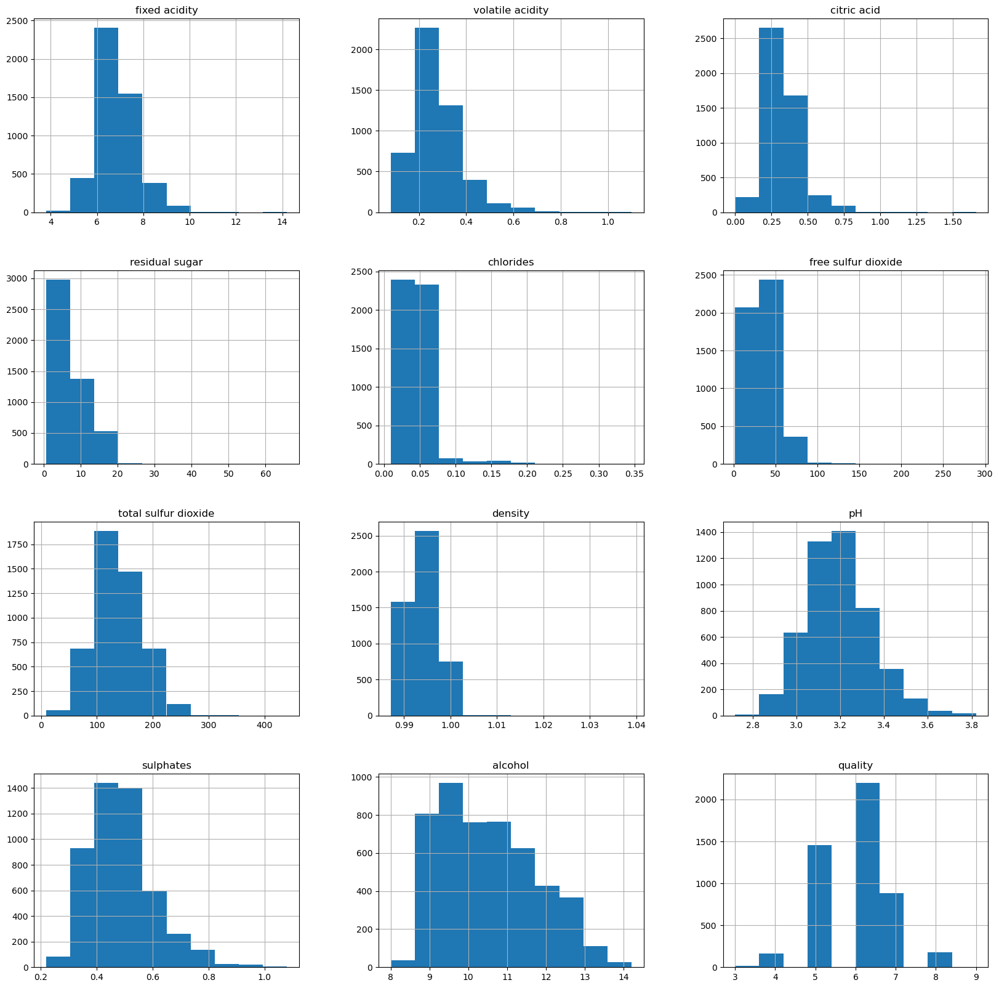

In [6]:
data.hist(figsize=(20, 20));

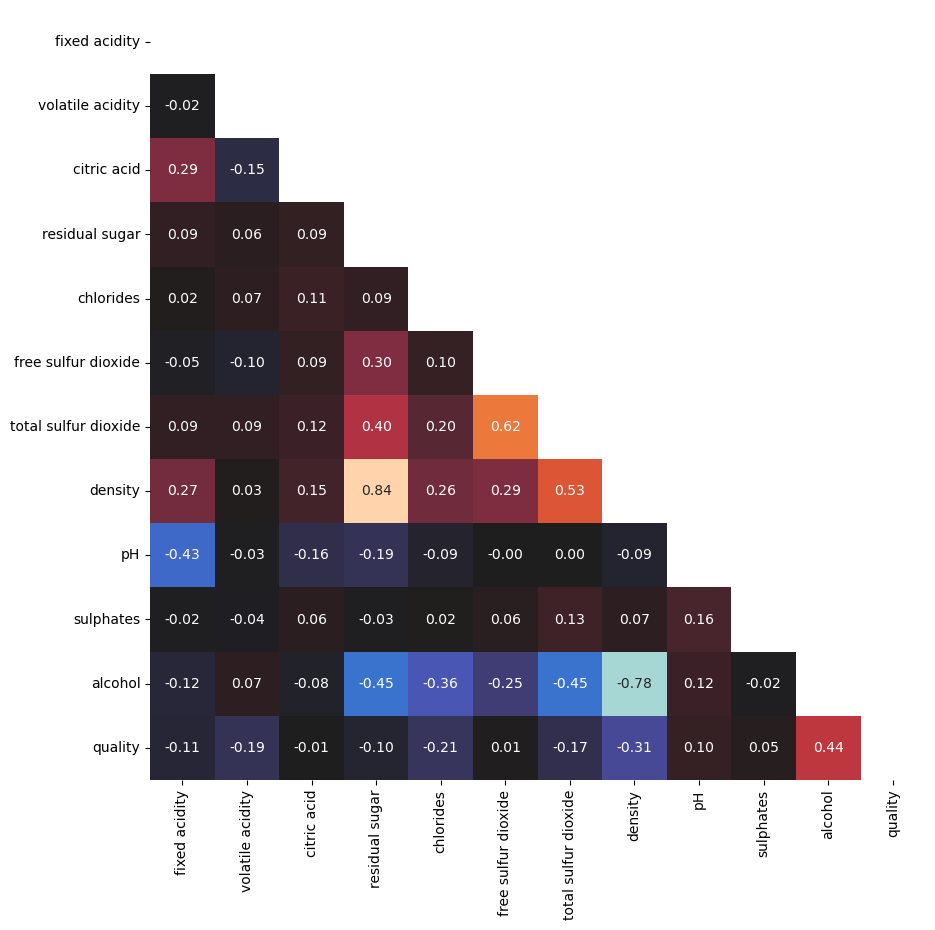

In [7]:
plt.figure(figsize=(10,10))

corr_matrix = data.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0);

In [8]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6)|(lower[column] < -0.6))
]
high_corr

['residual sugar', 'free sulfur dioxide', 'density']

In [9]:
other_features = [col for col in data.columns if col not in high_corr and col!='quality']

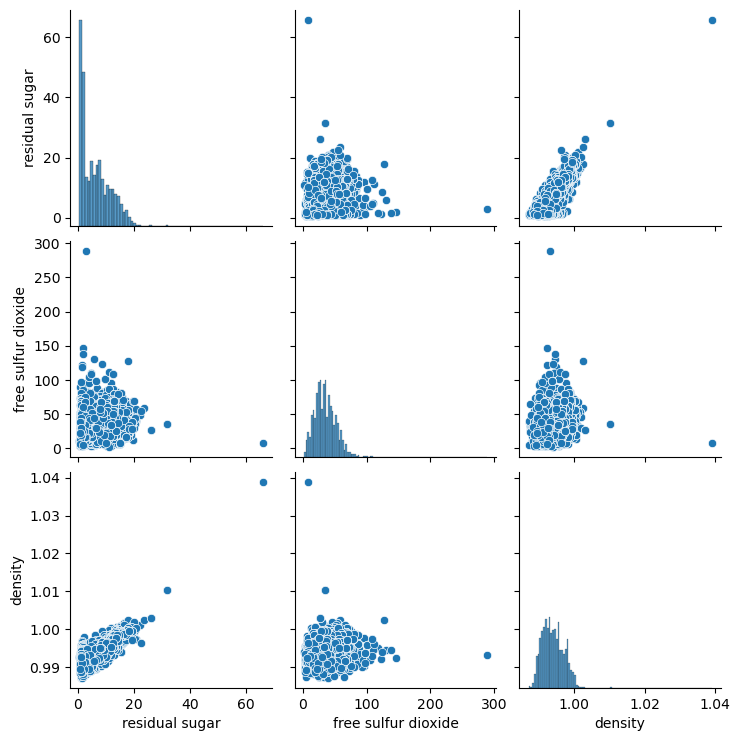

In [10]:
sns.pairplot(data[high_corr]);

# 2. Простейшие методы

## <center> 3-сигмы</center>

3-sigma.svg

In [11]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(axis = 1)
    return anomalies, up_bound, low_bound

In [12]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns

    outliers = pd.Series(data=[False]*len(data), index=data_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True

    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(by='anomalies_percentage', ascending=False)

    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))

In [13]:
data_features = data.iloc[:, :-1]

In [18]:
comparison_table, std_outliers = get_column_outliers(data_features)
anomalies_report(std_outliers)

Total number of outliers: 396
Percentage of outliers:   8.08%


In [19]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
chlorides,0.111316,-0.019772,102.0,2.082483
citric acid,0.697251,-0.028868,85.0,1.735402
volatile acidity,0.580625,-0.024143,81.0,1.653736
sulphates,0.832224,0.147469,48.0,0.979992
fixed acidity,9.386392,4.323183,46.0,0.939159
free sulfur dioxide,86.329497,-15.713327,32.0,0.653328
pH,3.641268,2.735265,32.0,0.653328
total sulfur dioxide,265.854851,10.866464,12.0,0.244998
residual sugar,21.607588,-8.824758,9.0,0.183748
density,1.003000,0.985055,3.0,0.061249


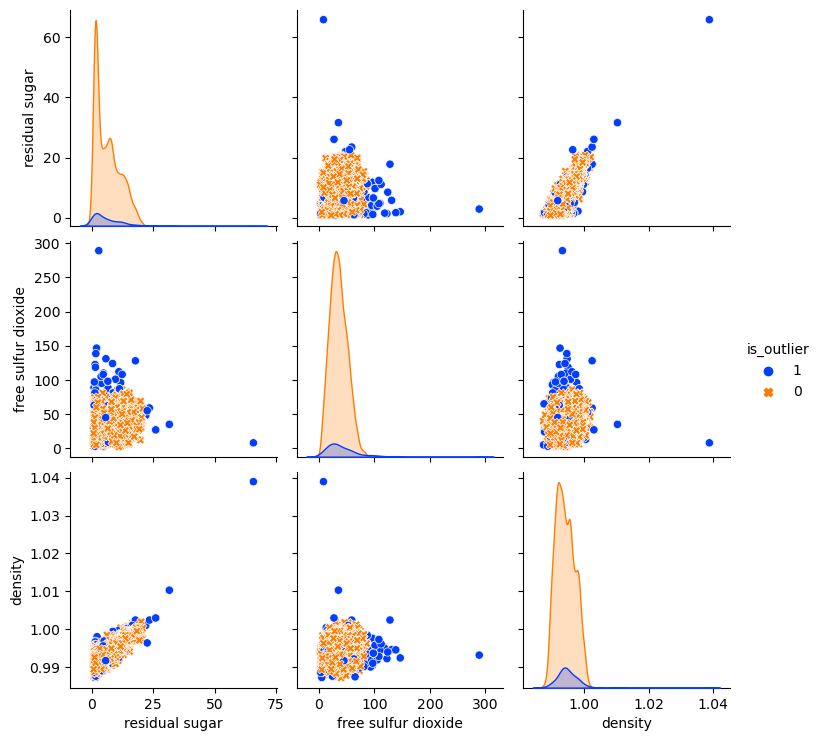

In [20]:
labeled_data = data_features[high_corr].copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

## <center> Межквартильное отклонение</center>

**Кванти́ль**  - значение, которое заданная случайная величина не превышает с фиксированной вероятностью. Если вероятность задана в процентах, то квантиль называется **процентилем** или **перцентилем**.


*   **0,25-квантиль** называется первым (или нижним) кварти́лем;

*   **0,5-квантиль** называется медианой;

*   **0,75-квантиль** называется третьим (или верхним) кварти́лем.


## <center> Box Plot ([ящик с усами](https://ru.wikipedia.org/wiki/%D0%AF%D1%89%D0%B8%D0%BA_%D1%81_%D1%83%D1%81%D0%B0%D0%BC%D0%B8))</center>

Границами ящика служат первый и третий квартили (25-й и 75-й пeрцентиль соответственно), линия в середине ящика — медиана (50-й процентиль). Концы усов — края статистически значимой выборки (без выбросов), и они могут определяться несколькими способами. Наиболее распространённые значения, определяющие длину «усов»:

*   Минимальное и максимальное наблюдаемые значения данных по выборке (в этом случае выбросы отсутствуют);
*   Разность первого квартиля и полутора межквартильных расстояний; сумма третьего квартиля и полутора межквартильных расстояний. В общем виде эта формула имеет вид






    

    

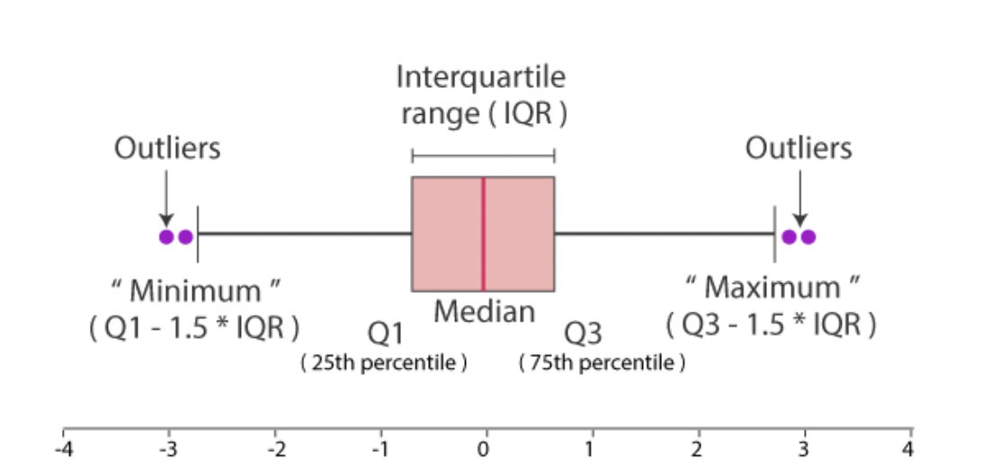

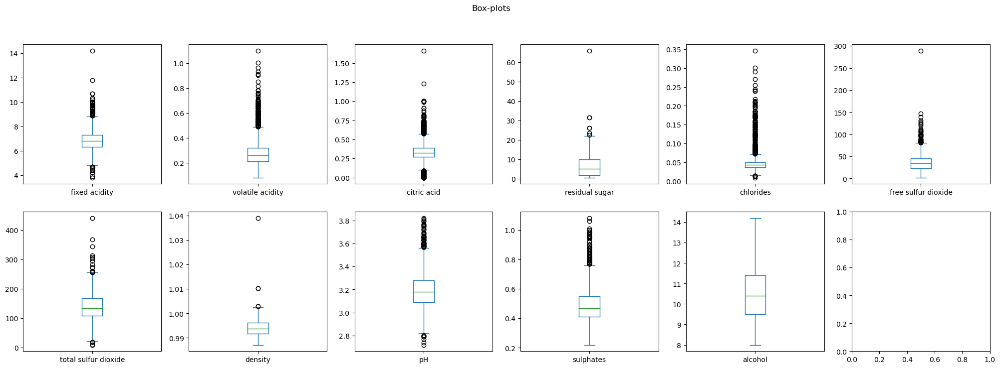

In [21]:
fig, axes = plt.subplots(2, 6, figsize=(25, 8))
fig.suptitle('Box-plots')

row=0
col=0

for ax, feature in enumerate(data_features):
    data_features[feature].plot.box(ax=axes[row, col])
    col+=1
    if col > 5:
        row+=1
        col=0

In [22]:
def outlier_iqr(data, col, threshold=1.5):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(axis = 1)
    return anomalies, up_bound, low_bound

In [23]:
comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 208
Percentage of outliers:   4.25%


In [24]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
chlorides,0.092000,-0.00600,131.0,2.674561
volatile acidity,0.650000,-0.12000,39.0,0.796243
citric acid,0.750000,-0.09000,22.0,0.449163
sulphates,0.970000,-0.01000,11.0,0.224581
free sulfur dioxide,115.000000,-46.00000,8.0,0.163332
fixed acidity,10.300000,3.30000,4.0,0.081666
density,1.009232,0.97859,3.0,0.061249
total sulfur dioxide,344.000000,-69.00000,2.0,0.040833
residual sugar,34.500000,-22.90000,1.0,0.020416
pH,3.850000,2.52000,0.0,0.000000


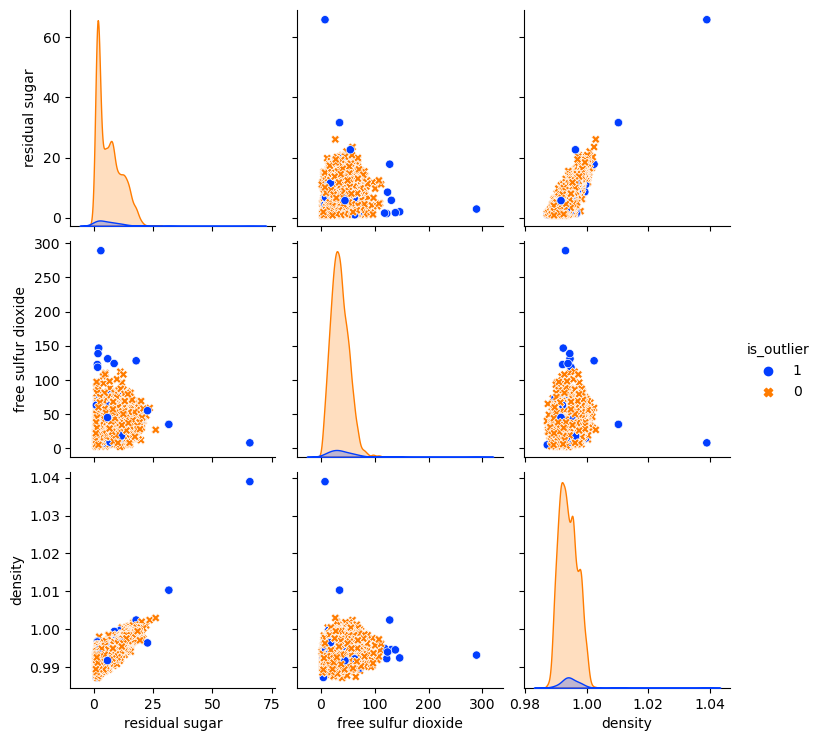

In [25]:
labeled_data = data_features[high_corr].copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

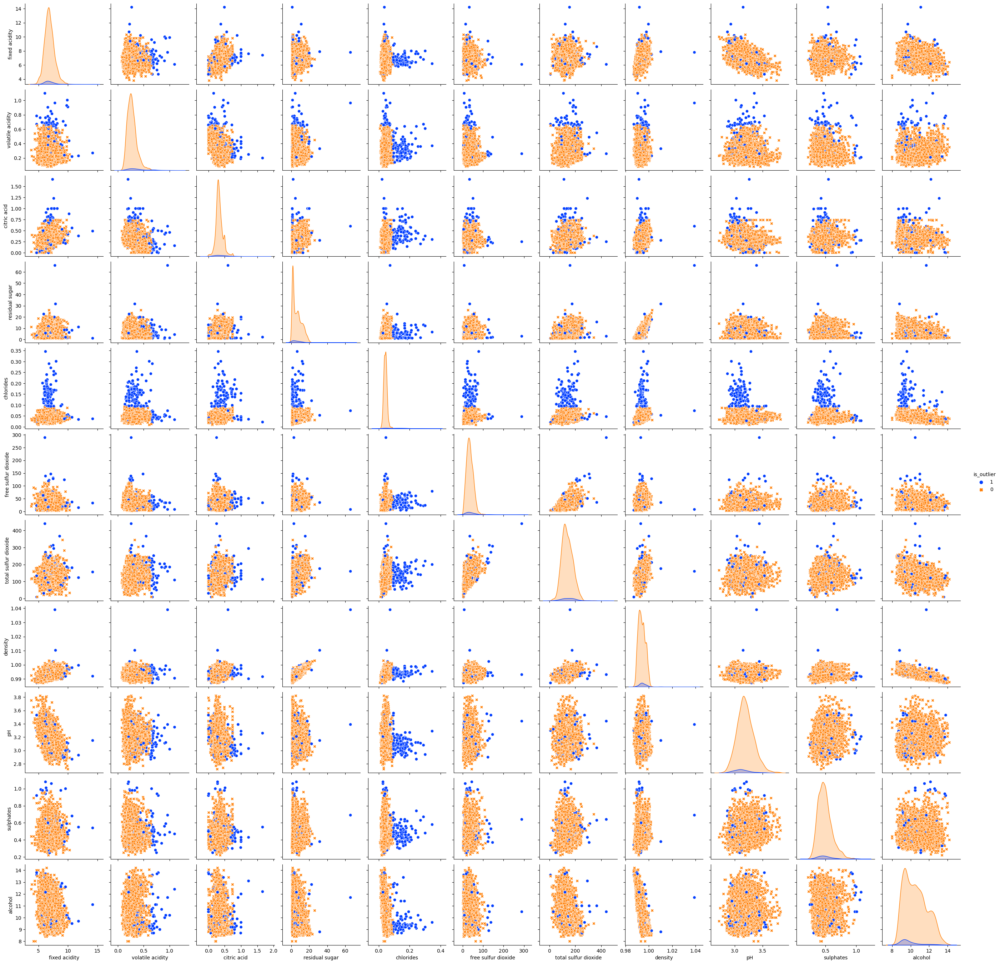

In [27]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, 
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

# 3. Кластеризация

## <center> Distance-based</center>

In [28]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    -----------
    Parameters:

    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)

    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile

    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)

    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

Так как мы имеем дело с расстояниями - нужно убедиться, что все данные в одном масштабе

In [29]:
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features),
    columns=data_features.columns
)

In [30]:
scaled_data.shape

(4898, 11)

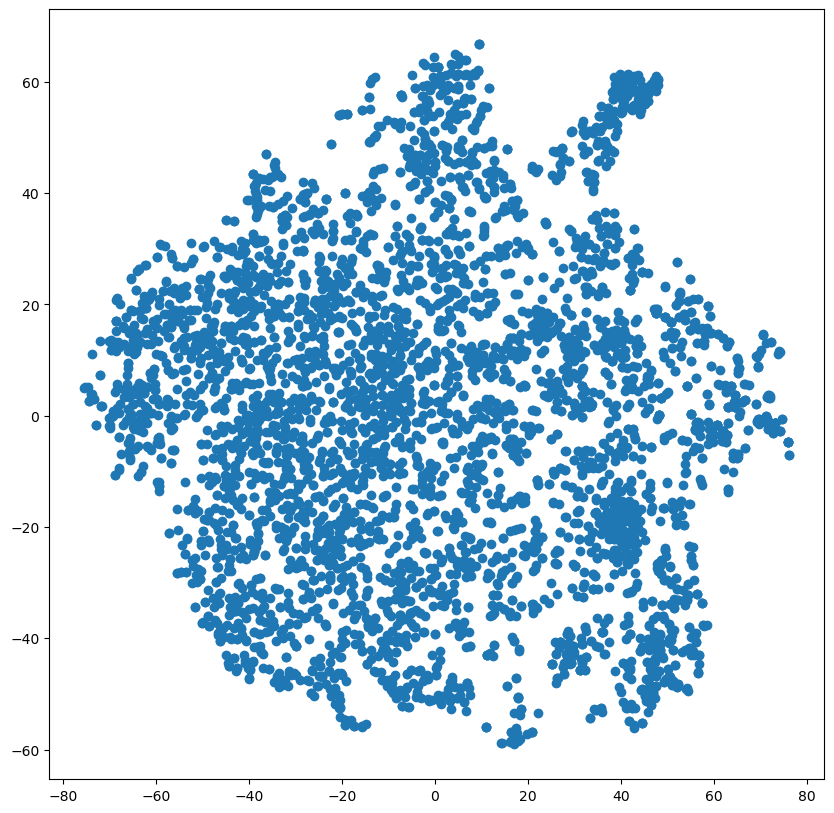

In [31]:
from sklearn.manifold import TSNE
tsne = TSNE(perplexity=50, n_jobs=-1)
tsne_transformed = tsne.fit_transform(scaled_data)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1]);

In [32]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=95)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)

Total number of outliers: 244
Percentage of outliers:   4.98%


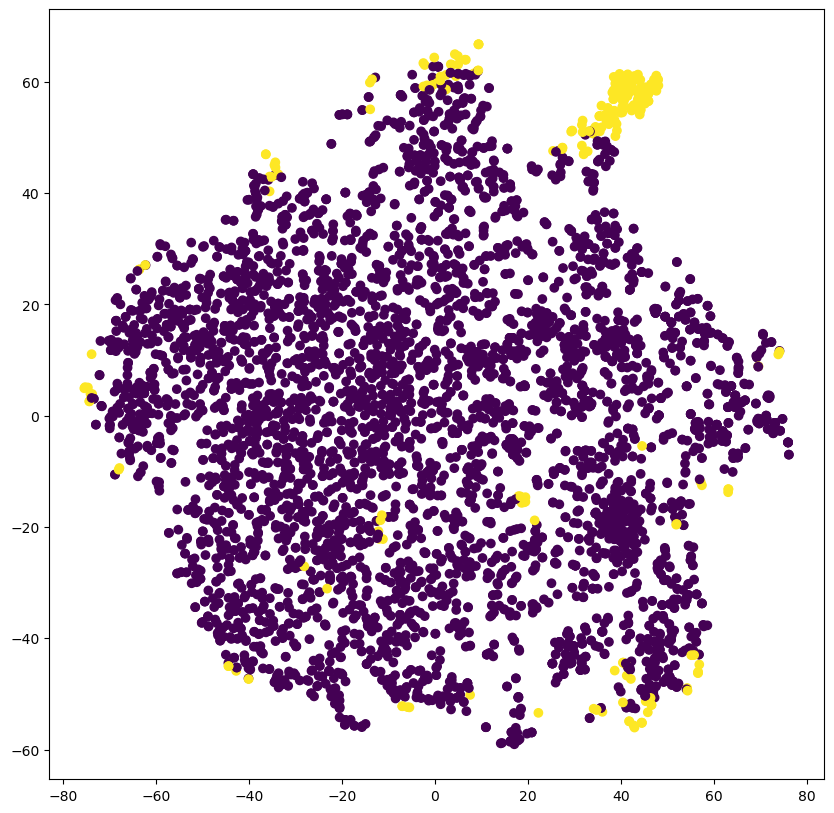

In [33]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

In [34]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=95)
citiblock_model.fit(scaled_data)
cityblock_outliers = citiblock_model.predict(scaled_data)
anomalies_report(cityblock_outliers)

labeled_data = data_features.copy()
labeled_data['is_outlier'] = cityblock_outliers

Total number of outliers: 245
Percentage of outliers:   5.00%


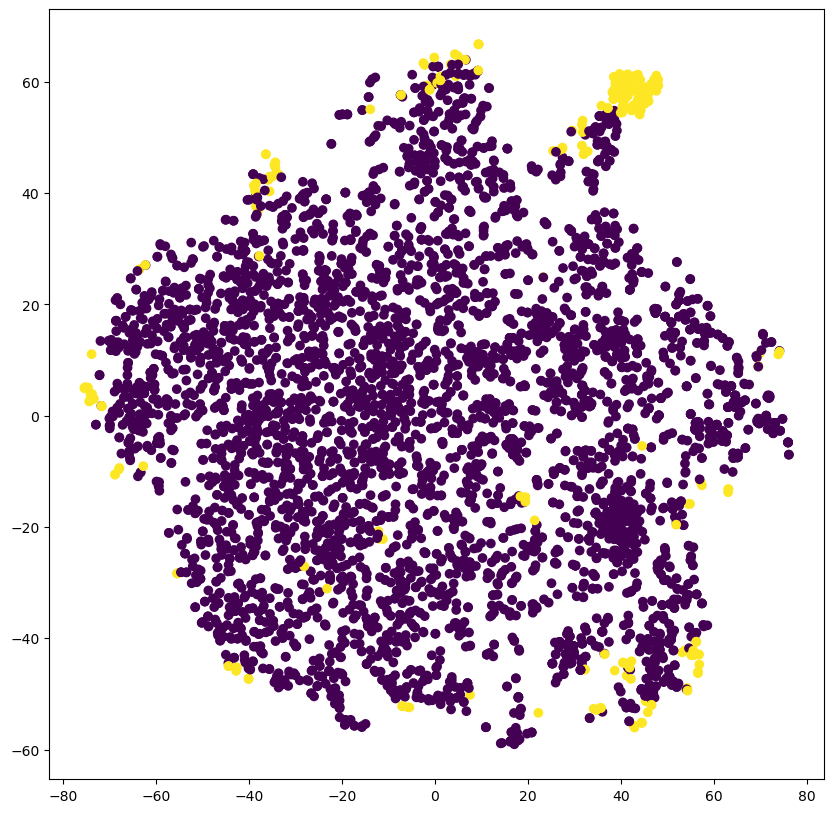

In [35]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers);

In [36]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=97)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)

Total number of outliers: 147
Percentage of outliers:   3.00%


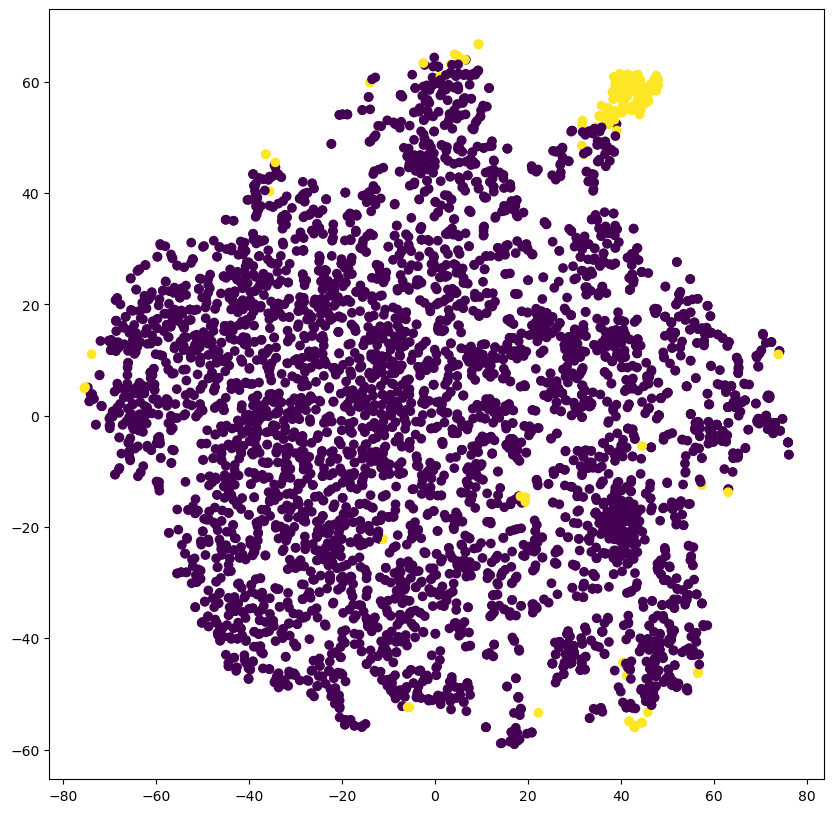

In [37]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

In [38]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=98)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)

Total number of outliers: 98
Percentage of outliers:   2.00%


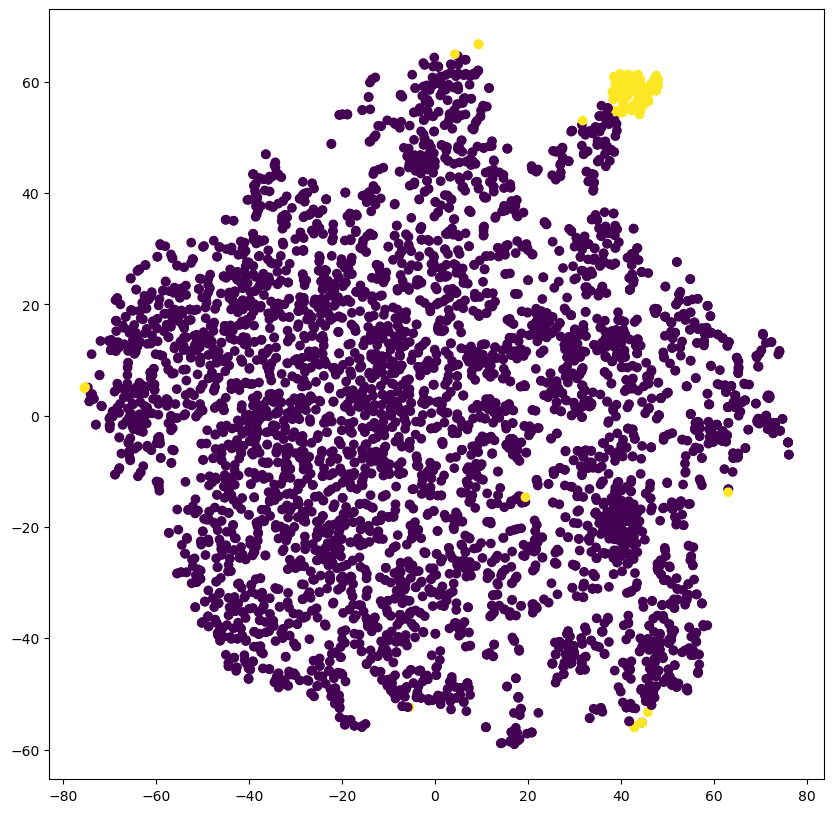

In [39]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

# <center> Density-based </center>

## <center>DBSCAN</center>

[Наглядная визуализация](https://www.naftaliharris.com/blog/visualizing-dbscan-clustering/) DBSCAN.


<img src="https://upload.wikimedia.org/wikipedia/commons/a/af/DBSCAN-Illustration.svg" width=500>

**Алгоритм:**
- 1. Выбираем случайную точку и находим её соседей в заданной
окрестности
- 2. Если соседей меньше критического значения – называем выбросами
- 3. Если нет – объединяем в «плотный» кластер и повторяем поиск соседей
- 4. Если все плотные точки пройдены и помечены как посещенные – выбираем новую не посещенную точку и начинаем сначала

Повторяем, пока все точки не будут посещены


**Преимущества:**
- Density-based (плотностной/вероятностный) метод – умеет в сложные формы кластеров
- Поиск выбросов и аномалий в данных

**Недостатки:**
- Довольно сложный в настройке – очень чувствителен к параметру ”плотности” epsilon

Идея - аномалии должны сильно отличаться от основных данных и скорее всего попадут в "шум". Почему бы не увеличивать epsilon до тех пор, пока все "плотные" данные не окажутся в нескольких немногочисленных кластерах, а шума будет столько, сколько мы подозреваем должно быть аномалий

In [41]:
from sklearn.cluster import DBSCAN

# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.01
eps_history = [eps]
while outlier_percentage>0.05:
    model = DBSCAN(eps=eps).fit(scaled_data)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)

model = DBSCAN(eps)
model.fit(scaled_data)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [42]:
eps

1.7600000000000011

In [44]:
anomalies_report(density_outlier)

Total number of outliers: 189
Percentage of outliers:   3.86%


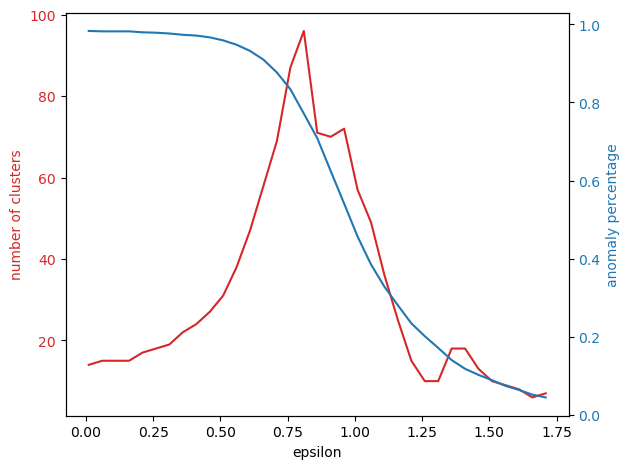

In [45]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('epsilon')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.show()

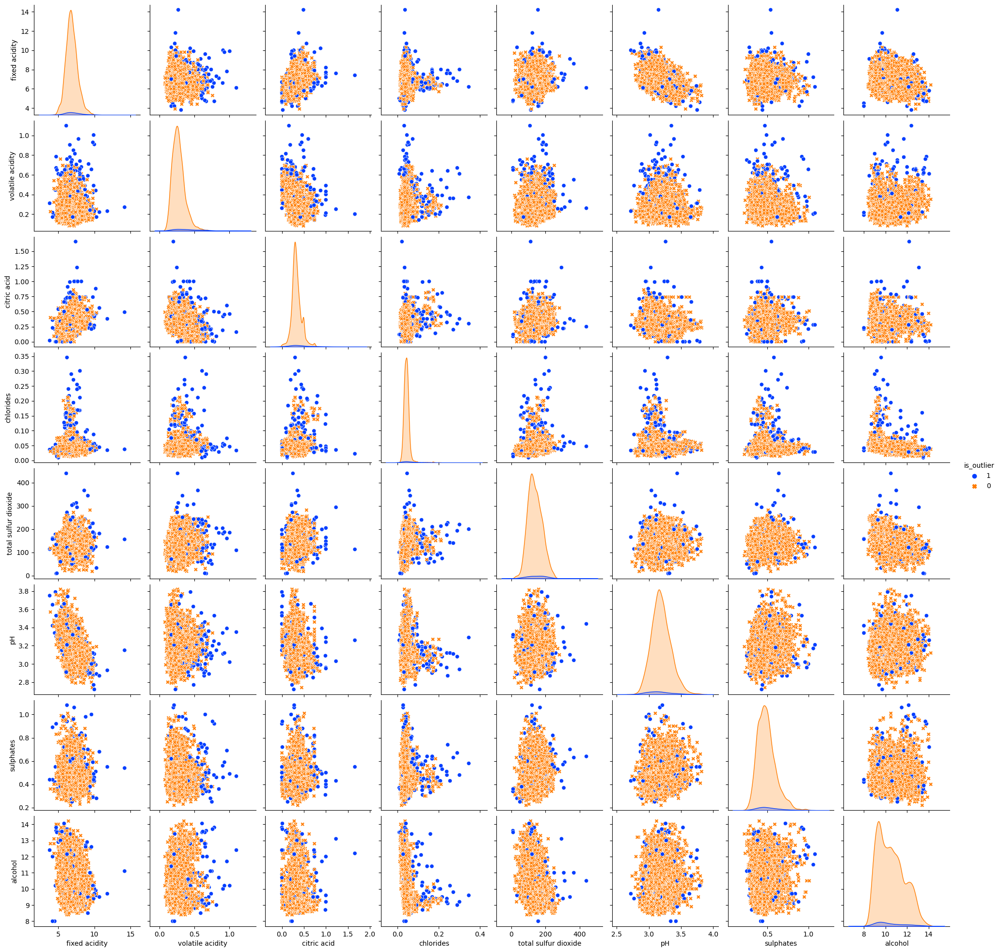

In [46]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outlier

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

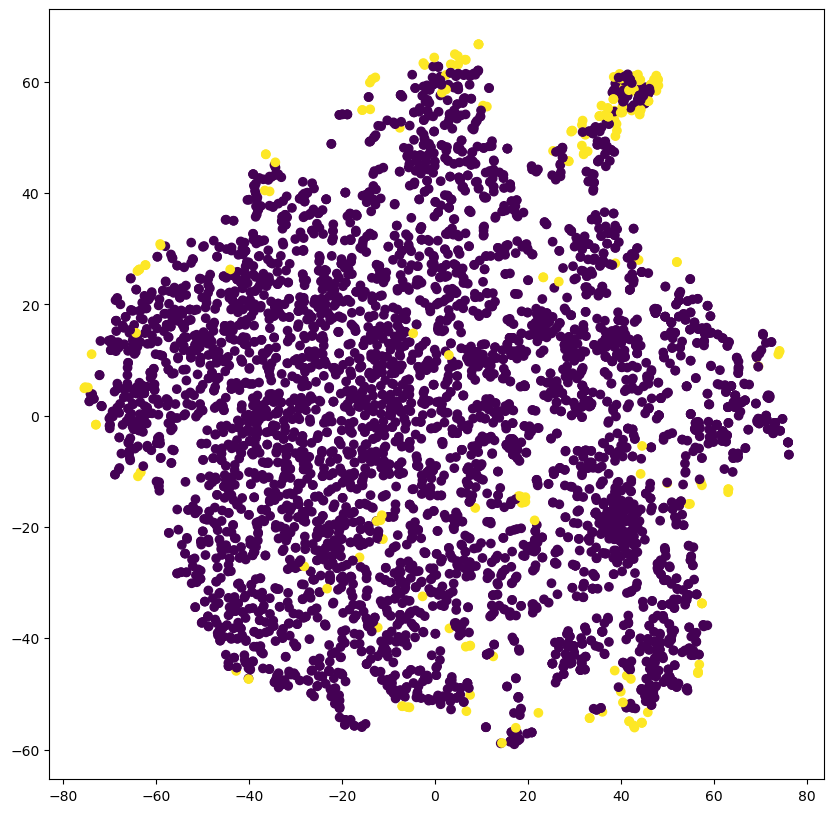

In [47]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=density_outlier);

# <center>4. Unsupervised model-based</center>

## <center>One-Class SVM</center>

## Коротко о Support Vector Machine

Если совсем вкратце, SVM - базовая линейная модель. Основная идея алгоритма (в случае с классификацией) - разделить классы гиперплоскостью так, чтобы максимизировать расстояние (зазор) между ними. Изначально алгоритм был способен работать только с линейно разделимыми классами, однако в 90-е годы прошлого века метод стал особенно популярен из-за внедрения "Kernel Trick" (1992), позволившего эффективно работать с линейно неразделимыми данными.

![](https://sandipanweb.files.wordpress.com/2018/04/svm_slack.png?w=676)

## Kernel Trick

Ядро (kernel) - это функция, которая способна преобразовать признаковое пространство (в том числе нелинейно), без непосредственного преобразования признаков.

Крайне эффективна в плане вычисления и потенциально позволяет получать бесконечноразмерные признаковые пространства.

Идея заключается в том, что классы, линейно неразделимые в текущем признаковом пространстве, могут стать разделимыми в пространствах более высокой размерности:

![](https://media.springernature.com/full/springer-static/image/art%3A10.1007%2Fs00466-023-02394-9/MediaObjects/466_2023_2394_Fig6_HTML.png?as=webp)

## One Class SVM
[Хорошая статья по One Class SVM](https://medium.com/@roshmitadey/anomaly-detection-using-support-vectors-2c1b842213ed)

**One Class SVM** - это одна из форм классического алгоритма, однако, как следует из названия, для его обучения нам достаточно иметь всего один класс, пусть даже и немного "зашумленный", при этом мы хотим научиться для каждого нового наблюдения принимать решение, является ли оно аномальным или нет.

**Общая идея:** преобразовать признаковое пространство и провести разделяющую гиперплоскость так, чтобы наблюдения лежали как можно дальше от начала координат:

![](https://www.researchgate.net/profile/Hany_Alashwal/publication/242572058/figure/fig1/AS:393295319584771@1470780319210/Classification-in-one-class-SVM.png)




В результате мы получаем границу, по одну сторону которой лежат максимально "плотные" и похожие друг на друга наблюдения из нашей тренировочной выборки, а по другую будут находится аномальные значения, не похожие на все остальные. Процент таких аномальных наблюдений, которые модель будет пытаться отделить от основной части выборки, мы снова задаём в самом начале обучения при помощи параметра `nu`

In [48]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.05, gamma='auto')
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [49]:
anomalies_report(svm_outliers)

Total number of outliers: 249
Percentage of outliers:   5.08%


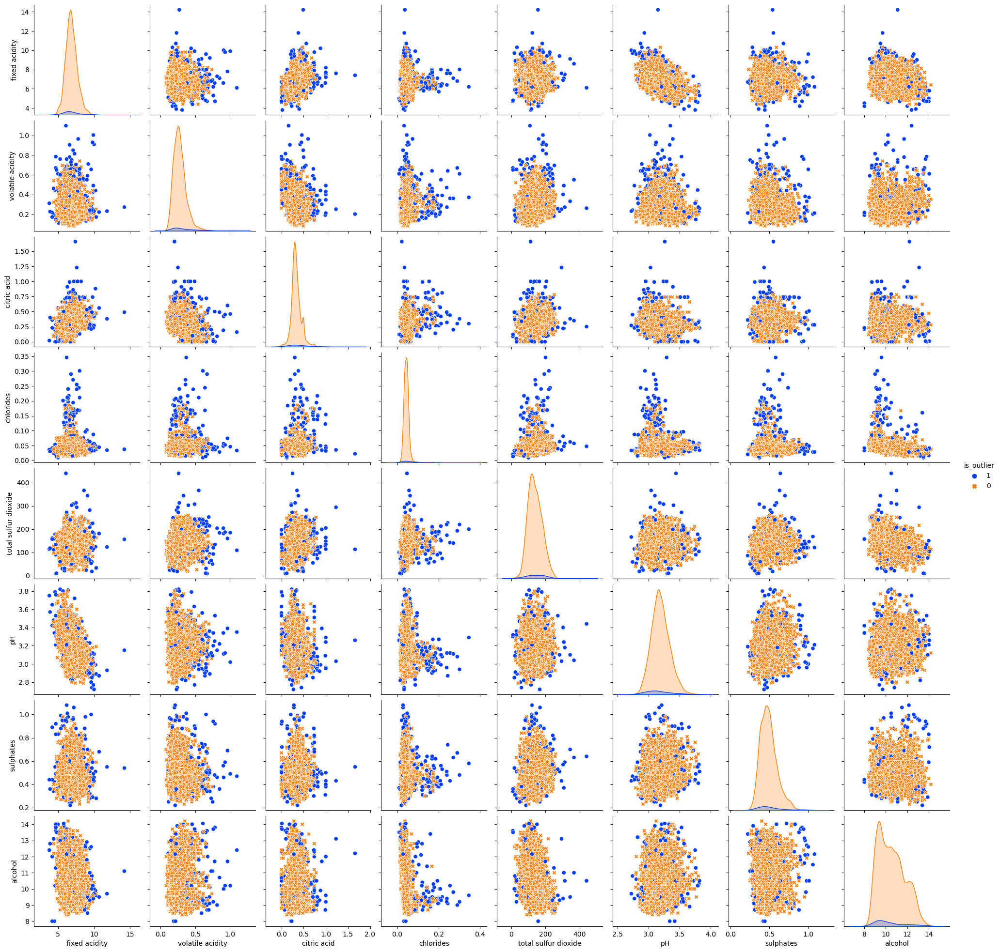

In [50]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = svm_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

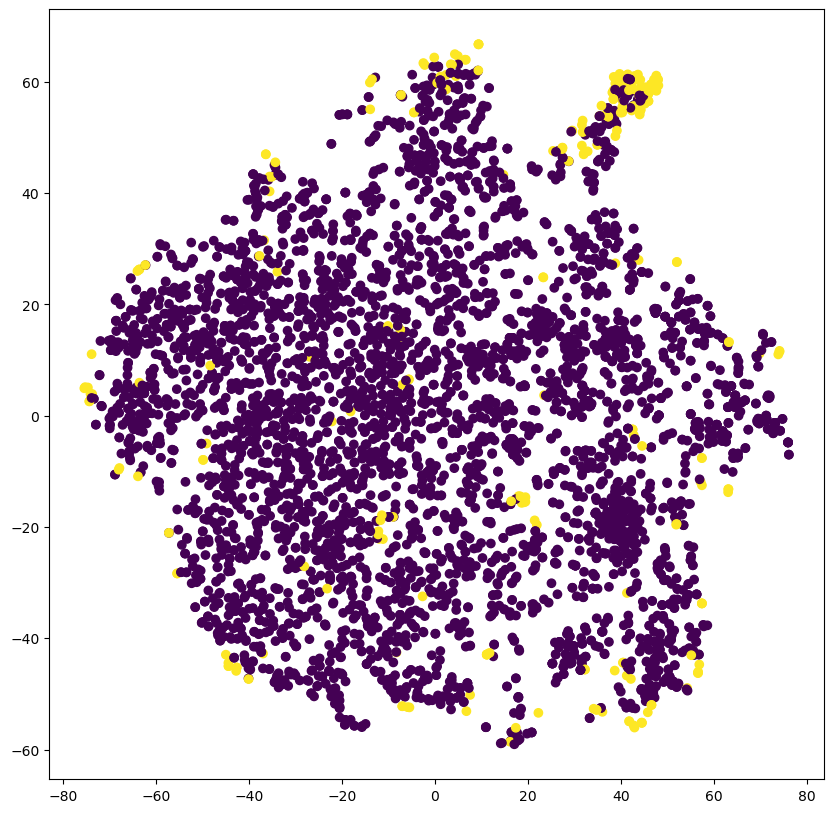

In [54]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=svm_outliers);

## Плюсы и минусы

\+ Благодаря kernel trick, модель способна проводить **нелинейные разделяющие границы**

\+ Особенно удобно использовать, когда в данных недостаточно "плохих" наблюдений, чтобы использовать стандартный подход обучения с учителем - бинарную классификацию

\- Необходимо заранее знать процент аномалий в данных (гиперпараметр `nu`)

\- Может очень сильно **переобучиться** и выдавать большое количество ложно отрицательных результатов, если разделяющий зазор слишком мал

## <center> Isolation Forest </center>

Идея - давайте посмотрим, насколько легко можно "изолировать" наблюдение от всех остальных. Если слишком легко, наверное она лежит далеко и является выбросом. Если очень тяжело - скорее всего она похожа на кучу других точек и выбросом не является.


**Алгоритм:**
1. Выберите точку, которую нужно изолировать.
2. Для каждой фичи установите диапазон изоляции между минимальным и максимальным.
3. Выберите фичу случайным образом.
4. Выберите значение, которое находится в диапазоне, опять же случайным образом:
    - Если точка лежит выше выбранного значение, сдвиньте минимальный диапазон фичи на это значение.
    - Если точка лежит ниже, сдвиньте максимальное значение фичи на значение.
5. Повторите шаги 3 и 4, пока точка не будет изолирована. То есть до тех пор, пока точка не станет единственной, находящейся внутри диапазона для всех фичей.
6. Посчитайте, сколько раз вам пришлось повторить шаги 3 и 4.

[Статья](https://quantdare.com/isolation-forest-algorithm/) про Isolation Forest + наглядная визуализация.

In [51]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=0.05,
                                   max_features=1.0, bootstrap=True)
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [52]:
anomalies_report(isolation_outliers)

Total number of outliers: 245
Percentage of outliers:   5.00%


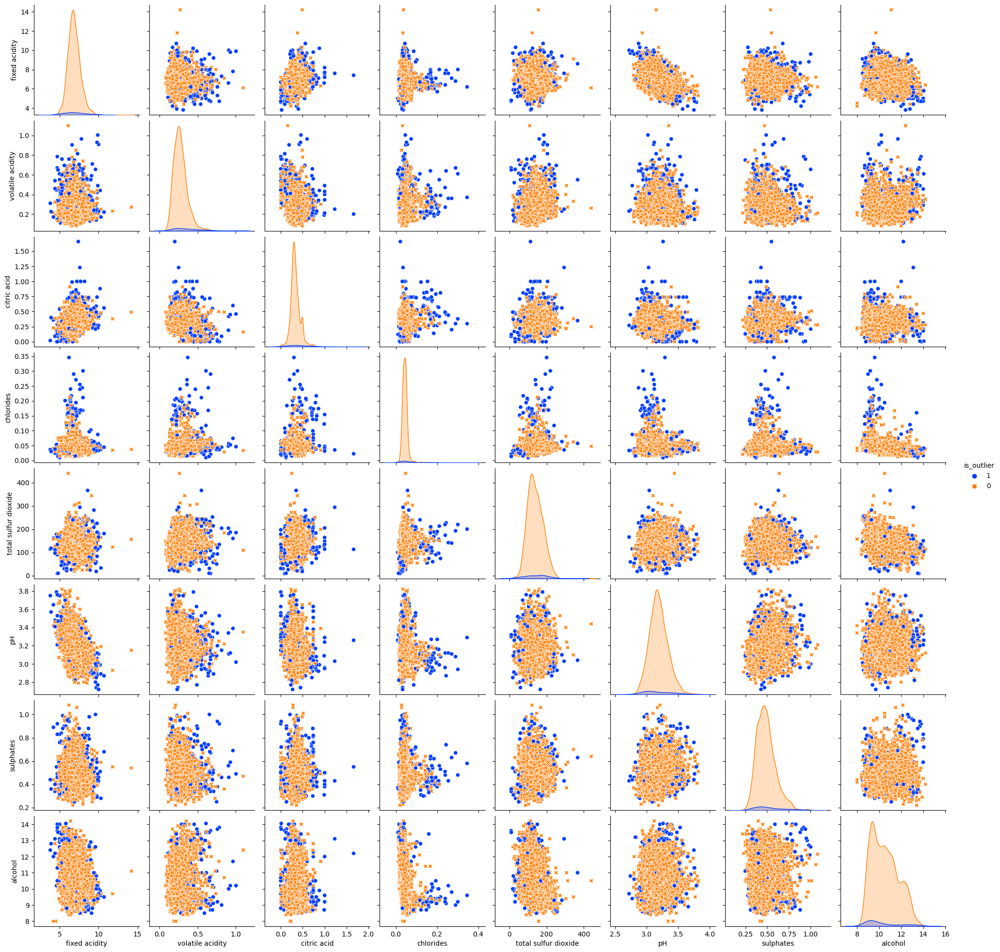

In [53]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = isolation_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

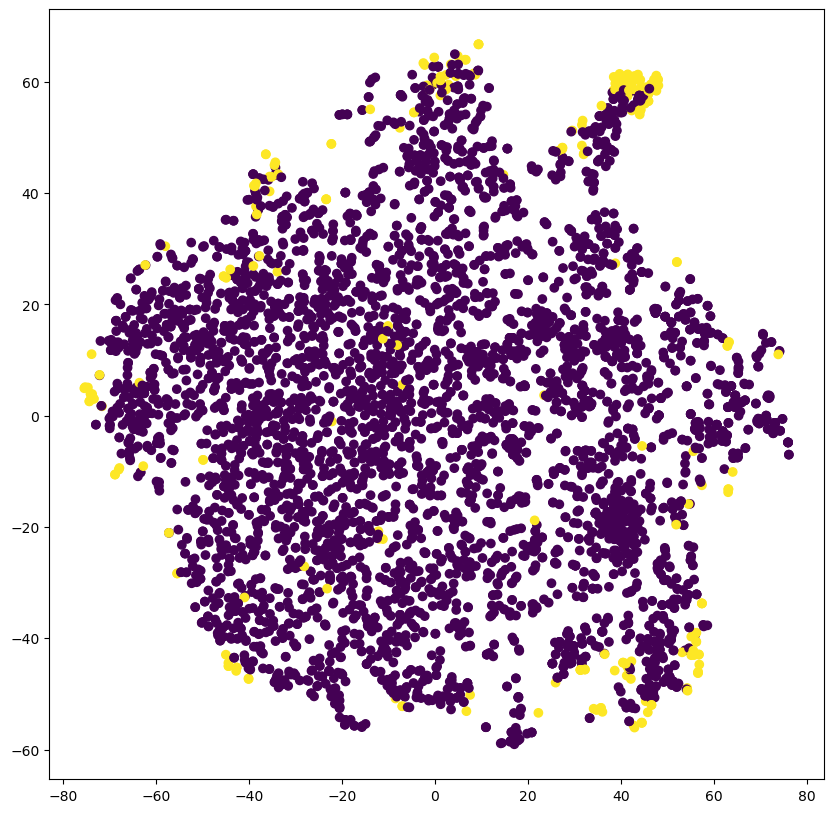

In [55]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=isolation_outliers);

## Плюсы и минусы

\+ Снова **нелинейные разделяющие границы**, интуитивно понятные принципы работы

\+ Снова удобно использовать, когда не можем в бинарную классификацию

\- Довольно сложная настройка параметров, которую тяжело проводить, не имея хотя бы минимальной разметки или предположения о количестве "грязных" наблюдений - параметр `contamination`

# Финальное сравнение

In [56]:
summary = np.concatenate((
    [std_outliers],
    [iqr_outliers],
    [euclidian_outliers],
    [cityblock_outliers],
    [density_outlier],
    [svm_outliers],
    [isolation_outliers]
))

In [57]:
summary = pd.DataFrame(
    summary.T,
    columns=['std', 'iqr', 'euclid', 'cityblock', 'dbscan', 'svm', 'isolation']
)
summary.head()

,std,iqr,euclid,cityblock,dbscan,svm,isolation
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0


In [58]:
summary.sum(axis=1).value_counts()

0    4348
1     198
2      92
4      73
5      52
3      51
6      45
7      39
dtype: int64

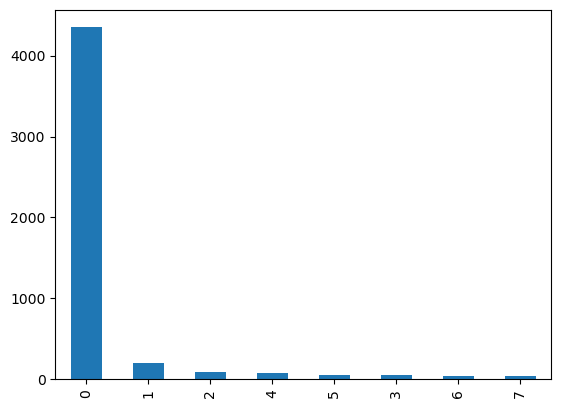

In [59]:
summary.sum(axis=1).value_counts().plot.bar();

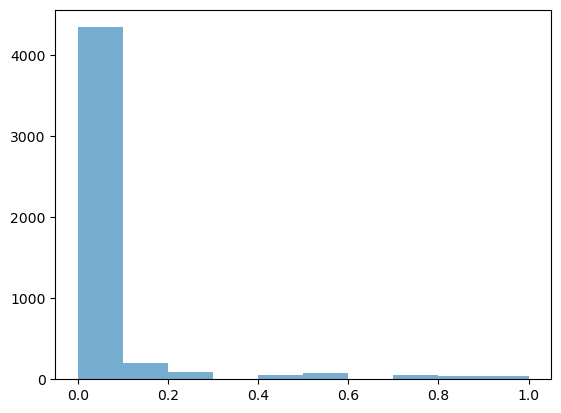

In [60]:
outlier_score = summary.mean(axis=1)
plt.hist(outlier_score, alpha=0.6);

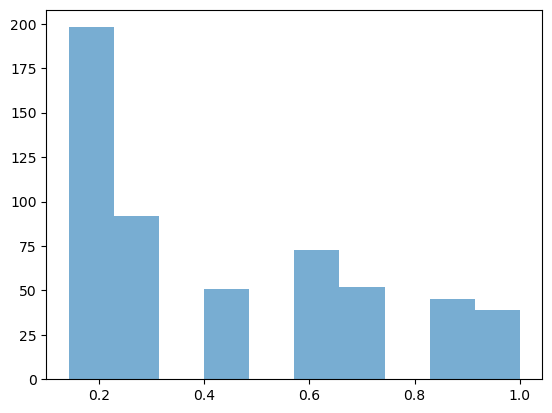

In [61]:
plt.hist(outlier_score[outlier_score > 0], alpha=0.6);

## All combined

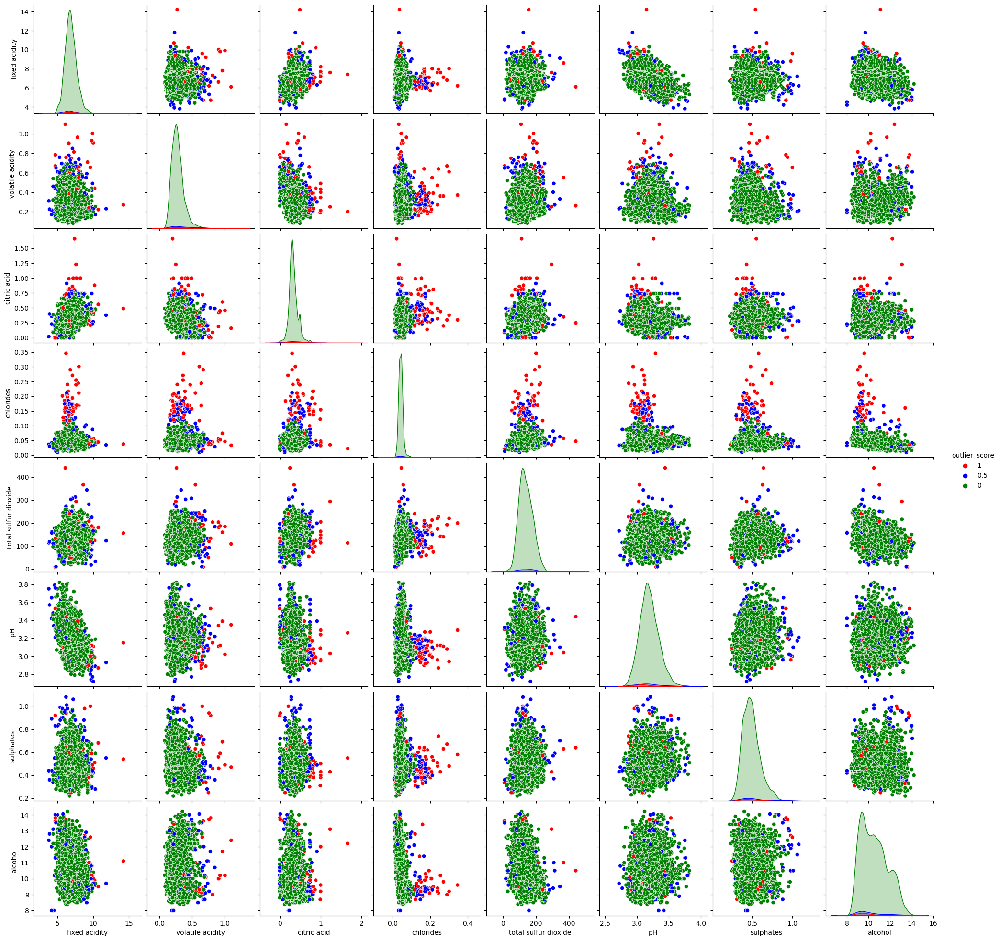

In [62]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
labeled_data['outlier_score'] = simple_score

custom_palette = {0:'g', 0.5:'b', 1.0:'r'}

sns.pairplot(data=labeled_data, vars=other_features,
             hue='outlier_score',
             hue_order=[1, 0.5, 0],
             palette=custom_palette
)

0    4520
1     167
2     117
3      94
dtype: int64

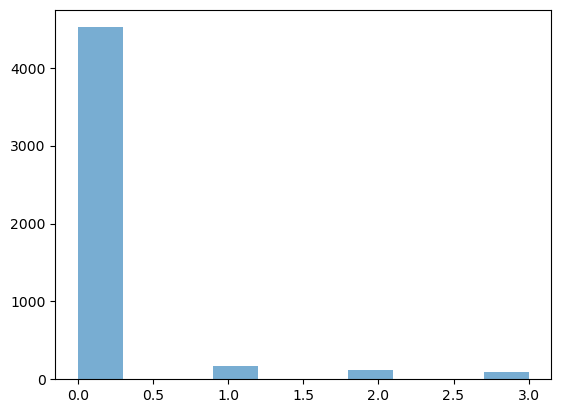

In [63]:
outliers_score_model_based = summary[['dbscan', 'svm', 'isolation']].sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6);
outliers_score_model_based.value_counts()

Дополнительные материалы:
- [Поиск аномалий](https://medium.com/open-machine-learning-course/open-machine-learning-course-topic-9-time-series-analysis-in-python-a270cb05e0b3) во временных рядах
- [Плотностные методы](https://towardsdatascience.com/density-based-algorithm-for-outlier-detection-8f278d2f7983) для поиска аномалий
- [Еще раз](https://blog.floydhub.com/introduction-to-anomaly-detection-in-python/) про классику